In [ ]:
!pip install keras==2.15

In [1]:
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import os
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Embedding, RNN, Conv2D, LSTMCell
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.losses import SparseCategoricalCrossentropy
import copy
from keras.utils import plot_model
from nltk.translate.bleu_score import sentence_bleu
import numpy as np
from sklearn.model_selection import train_test_split
from nltk.translate.bleu_score import SmoothingFunction
from keras.callbacks import ModelCheckpoint
from keras.optimizers import Adam

2024-04-22 16:46:38.797219: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-22 16:46:38.797348: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-22 16:46:38.926898: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
keras.__version__

'2.15.0'

In [3]:
Data_frame = pd.read_csv('/kaggle/input/image-caption-data-iitm-cs6910/Image caption data G24_cs6910_IITM/24_captions_and_image_names/captions.txt',delimiter='\t',header=None)
Data_frame.columns=['image_id','captions']
Data_frame['image_id']=Data_frame['image_id'].str.split('#').str.get(0)
Data_frame = Data_frame.drop(Data_frame[Data_frame['image_id']=='2258277193_586949ec62.jpg.1'].index)

In [4]:
def preprocess_text(data):
    data =copy.deepcopy(data)
    data['captions'] = data['captions'].apply(lambda x: x.lower())
    data['captions'] = data['captions'].apply(lambda x: x.replace("[^A-Za-z]",""))
    data['captions'] = data['captions'].apply(lambda x: x.replace("\s+"," "))
    data['captions'] = data['captions'].apply(lambda x: " ".join([word for word in x.split() if len(word)>1]))
    data['captions'] = "sos "+data['captions']+" eos"
    return data

In [5]:
new_data = preprocess_text(Data_frame)

In [6]:
train_df, test_df = train_test_split(new_data, test_size=0.1, random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42)

train_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)
val_df.reset_index(drop=True, inplace=True)

In [7]:
tokenizer = tf.keras.preprocessing.text.Tokenizer(oov_token = '<UNK>')

# Fit the tokenizer on the captions
tokenizer.fit_on_texts(new_data['captions'])

vocab_size = len(tokenizer.word_index)+1
longest_seq = 0
for captions in new_data['captions'].values:
    longest_seq = max(longest_seq,len(tokenizer.texts_to_sequences([captions])[0]))
    
print(vocab_size)
print(longest_seq)

8486
35


In [8]:
class CustomDataset(tf.keras.utils.Sequence):
    def __init__(self, dataframe, image_dir, tokenizer, max_caption_length, batch_size=32, image_size=(224, 224)):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.tokenizer = tokenizer
        self.batch_size = batch_size
        self.image_size = image_size
        self.captions = self.dataframe['captions'].tolist()
        self.image_ids = self.dataframe['image_id'].tolist()
        self.num_samples = len(self.image_ids)
        self.max_caption_length = max_caption_length
        self.indexes = np.arange(self.num_samples)
        self.on_epoch_end() # Shuffle dataset indexes initially
        #self.test = test

    def __len__(self):
        return int(np.ceil(self.num_samples / self.batch_size))

    def __getitem__(self, index):
        batch_indexes = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]
        
        np.random.shuffle(batch_indexes)
        batch_image_ids = [self.image_ids[i] for i in batch_indexes]
        batch_captions = [self.captions[i] for i in batch_indexes]
        images, input_captions, target_captions = self.process_data(batch_image_ids, batch_captions)
        return (images, input_captions), target_captions

    def load_and_preprocess_image(self, image_path):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, self.image_size)
        return image

    def process_data(self, batch_image_ids, batch_captions):
        images = []
        input_captions = []
        target_captions = []
        for image_id, caption in zip(batch_image_ids, batch_captions):
            image_path = os.path.join(self.image_dir, image_id)
            image = self.load_and_preprocess_image(image_path)
            caption_sequence = self.tokenizer.texts_to_sequences([caption])[0]
            input_caption = pad_sequences([caption_sequence[:-1]], maxlen=self.max_caption_length, padding='post')[0]
            target_caption = pad_sequences([caption_sequence[1:]], maxlen=self.max_caption_length, padding='post')[0]
            images.append(image)
            input_captions.append(input_caption)
            target_captions.append(target_caption)
        return tf.convert_to_tensor(images), tf.convert_to_tensor(input_captions), tf.convert_to_tensor(target_captions)

    def on_epoch_end(self):
        np.random.shuffle(self.indexes)

In [9]:
image_dir = '/kaggle/input/image-caption-data-iitm-cs6910/Image caption data G24_cs6910_IITM/Images'
Val_data = CustomDataset(val_df, image_dir, tokenizer, longest_seq, batch_size=64)
Test_data = CustomDataset(test_df, image_dir, tokenizer, longest_seq, batch_size=64)
Train_data = CustomDataset(train_df, image_dir, tokenizer, longest_seq, batch_size=64)

In [10]:
def CNN_feature_extractor(image):
    VGG16=tf.keras.applications.VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(224,224,3))
    VGG16.trainable = False
    image = tf.keras.applications.vgg16.preprocess_input(image)
    features = VGG16(image)
    #features = Flatten()(features)
    #features = Dense(256)(features)
    
    return features

In [11]:
def Net_Vlad(inputs, num_cluster):
    batch_size = tf.shape(inputs)[0]
    conv2D_layer = Conv2D(filters = num_cluster, kernel_size=(1,1))
    
    softmax_weights = tf.nn.softmax(conv2D_layer(inputs), axis=-1) # shape batch_size, inputs.shape[1], inputs.shape[2], filters
   
    weights = conv2D_layer.get_weights() # w shape 1,1,input_dim, filters # b shape filters,
    #print(weights)
    kernel_weights = weights[0].transpose(0,1,3,2) # w shape 1,1, filters, input_dim
    bias = weights[1]
    bias = bias[None,None,:,None]# broadcast the shape to 1,1,filters,1
    epsilon = 1e-6
    squared_norm = tf.square(tf.norm(kernel_weights, axis=-1, keepdims=True))+epsilon
    
    cluster_center = kernel_weights*bias/squared_norm
    
    cluster_centers_reshaped = tf.reshape(cluster_center, (1, 1, 1, 64, 512))

    # Initialize an empty list to store the results
    results = []

    # Iterate over each cluster center
    for i in range(64):
        # Subtract the i-th cluster center from each spatial point in the image
        result = inputs - cluster_centers_reshaped[..., i, :]
        # Append the result to the list
        results.append(result)
# Stack the results along the channel dimension to get the final tensor
    result_tensor = tf.stack(results, axis=-4) # shape batch_size, filters, inputs.shape[1], inputs.shape[2], input_dim
    
    
    softmax_weights = tf.transpose(softmax_weights, perm=[0, 3, 1, 2])
    softmax_weights = tf.expand_dims(softmax_weights, axis=-1) # shape batch_size, filters, inputs.shape[1], inputs.shape[2], 1
    
    vlad = tf.reduce_sum(result_tensor * softmax_weights, axis=[2, 3])  # batch_size, num_cluster, input_dim

    # Intra-normalization
    vlad = tf.math.l2_normalize(vlad, axis=-1)
    
    #print(vlad.shape)
    # Flatten
    vlad = tf.reshape(vlad, (batch_size, vlad.shape[1]*vlad.shape[2]))

    # L2 normalization
    vlad = tf.math.l2_normalize(vlad, axis=-1)
    
    dim_reduce = Dense(256)(vlad)

    return dim_reduce

In [12]:
def LSTM_decoder(img_enc, captions, teacher_forcing_ratio =0.5, test=False):
    batch_size = tf.shape(img_enc)[0]
    embedding_layer = tf.keras.layers.Embedding(input_dim=vocab_size, output_dim=512)

    # Define the SimpleRNNCell
    cell = LSTMCell(256)
    dense = Dense(vocab_size)

    # Initialize the state of the cell with image encoding
    initial_state = img_enc
    cell_state = img_enc

    # Initialize a list to store the outputs
    outputs = []

    # Generate a random number between 0 and 1 for the entire batch
    
    embedded = embedding_layer(captions)
    previous_prediction = embedded[:,0,:]
    
    for i in range(captions.shape[1]):
        # Get the input at the current timestep
        input_at_timestep = embedded[:, i, :]
        random_number = tf.random.uniform([], minval=0, maxval=1)
        # Decide whether to use teacher forcing based on the random number
        use_teacher_forcing = (True if random_number>teacher_forcing_ratio else False)

        if test:
            # Use the model's own predicted output for the next timestep as input
            output_at_timestep, (initial_state, cell_state) = cell(previous_prediction,[initial_state,cell_state])
        else:
            if use_teacher_forcing==False:
                output_at_timestep, (initial_state, cell_state) = cell(previous_prediction,[initial_state,cell_state])
            else:
                output_at_timestep, (initial_state, cell_state) = cell(input_at_timestep,[initial_state,cell_state])

        # Apply dense layer to get logits
        logits = dense(output_at_timestep)

        # Store the output and update the initial state for the next timestep
        outputs.append(logits)

        # Update the previous prediction for the next timestep
        previous_prediction = embedding_layer(tf.argmax(logits, axis=-1))

    # Stack the outputs to get the final output tensor
    rnn_output = tf.stack(outputs, axis=1)

    return rnn_output

In [13]:
inp_1 = Input(shape=(224,224,3))
inp_2 = Input(shape=(35,))
out_1 = CNN_feature_extractor(inp_1)
out_2 = Net_Vlad(out_1, 64)
out_f = LSTM_decoder(out_2, inp_2, teacher_forcing_ratio=0.5, test=False)
model = Model(inputs=[inp_1,inp_2],outputs=out_f)

58889256/58889256 [==============================] - 0s 0us/step


In [14]:
chencherry = SmoothingFunction()
def preprocess_texts(texts):
    to_remove = ['sos', 'eos', '<UNK>']
    cleaned_texts = []
    for text in texts:
        sent = tokenizer.sequences_to_texts([text.numpy()])[0].split()
        final = [word for word in sent if word not in to_remove]
        cleaned_texts.append(final)
    return cleaned_texts

def compute_bleu_score(y_true, y_pred,wt):
    y_true_texts = tf.py_function(preprocess_texts, [y_true], Tout=tf.string)
    y_pred_texts = tf.py_function(preprocess_texts, [tf.argmax(y_pred, axis=-1)], Tout=tf.string)
    
    bleu_scores = tf.py_function(lambda x, y: sentence_bleu([x.numpy()], y.numpy(),weights = wt,smoothing_function=chencherry.method1), (y_true_texts, y_pred_texts), Tout=tf.float32)
    return bleu_scores

def bleu_1(y_true, y_pred):
    wt=(1,0,0,0)
    return tf.reduce_mean(compute_bleu_score(y_true, y_pred,wt))

def bleu_2(y_true, y_pred):
    wt=(1/2,1/2,0,0)
    return tf.reduce_mean(compute_bleu_score(y_true, y_pred,wt))

def bleu_3(y_true, y_pred):
    wt=(1/3,1/3,1/3,0)
    return tf.reduce_mean(compute_bleu_score(y_true, y_pred,wt))

def bleu_4(y_true, y_pred):
    wt=(1/4,1/4,1/4,1/4)
    return tf.reduce_mean(compute_bleu_score(y_true, y_pred,wt))

In [15]:
model.load_weights('/kaggle/input/lstm-model-image-captioning/LSTM_caption_generator_round_1.keras')
model.compile(optimizer=Adam(learning_rate = 0.001), loss = SparseCategoricalCrossentropy(from_logits=True), metrics = [bleu_1,bleu_2,bleu_3,bleu_4])
chkpt = ModelCheckpoint('LSTM_caption_generator.keras',monitor='val_loss',save_weights_only=True,verbose=1)
history = model.fit(Train_data,validation_data = Val_data, epochs=20, verbose = 1, callbacks=[chkpt])

Epoch 1/20


I0000 00:00:1713804444.802715     106 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


456/456 [==============================] - ETA: 0s - loss: 1.1342 - bleu_1: 0.3218 - bleu_2: 0.1812 - bleu_3: 0.1032 - bleu_4: 0.0692
Epoch 1: saving model to LSTM_caption_generator.keras
456/456 [==============================] - 499s 1s/step - loss: 1.1342 - bleu_1: 0.3218 - bleu_2: 0.1812 - bleu_3: 0.1032 - bleu_4: 0.0692 - val_loss: 1.2404 - val_bleu_1: 0.2929 - val_bleu_2: 0.1467 - val_bleu_3: 0.0867 - val_bleu_4: 0.0640
Epoch 2/20
456/456 [==============================] - ETA: 0s - loss: 1.0449 - bleu_1: 0.3419 - bleu_2: 0.1950 - bleu_3: 0.1129 - bleu_4: 0.0766
Epoch 2: saving model to LSTM_caption_generator.keras
456/456 [==============================] - 400s 876ms/step - loss: 1.0449 - bleu_1: 0.3419 - bleu_2: 0.1950 - bleu_3: 0.1129 - bleu_4: 0.0766 - val_loss: 1.2197 - val_bleu_1: 0.2720 - val_bleu_2: 0.1403 - val_bleu_3: 0.0854 - val_bleu_4: 0.0584
Epoch 3/20
456/456 [==============================] - ETA: 0s - loss: 0.9925 - bleu_1: 0.3521 - bleu_2: 0.1950 - bleu_3: 0.113

KeyboardInterrupt: 

In [16]:
def show_and_tell(model,image,true_label):
    true_caption = ' '.join(preprocess_texts([true_label])[0])
    image = tf.expand_dims(image,axis=0)
    label = tf.expand_dims(true_label,axis=0)
    output = model((image,label))
    predicted = tf.argmax(output,axis=-1)
    pred_caption = ' '.join(preprocess_texts(predicted)[0])
    plt.imshow(image[0]/255.0)
    plt.axis('off')
    plt.show()
    print('predicted:',pred_caption)
    print('original:',true_caption)
    print('\n\n')

In [18]:
weights = model.get_weights()
inp_1 = Input(shape=(224,224,3))
inp_2 = Input(shape=(35,))
out_1 = CNN_feature_extractor(inp_1)
out_2 = Net_Vlad(out_1, 64)
out_f = LSTM_decoder(out_2, inp_2, teacher_forcing_ratio=0.5, test = True)
new_model = Model(inputs=[inp_1,inp_2],outputs=out_f)
new_model.set_weights(weights)
new_model.trainable = False
new_model.compile(optimizer='adam', loss = SparseCategoricalCrossentropy(from_logits=True), metrics = [bleu_1,bleu_2,bleu_3,bleu_4])

In [19]:
(i,l),t=next(iter(Test_data))
i = i[:20]
l = l[:20]

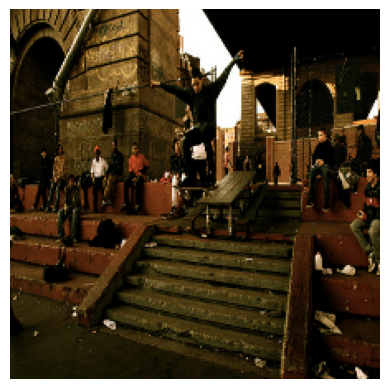

predicted: people sit at table table table restaurant
original: man rides skateboard off of picnic table over the steps





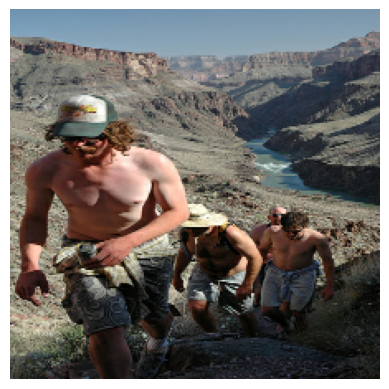

predicted: young man in purple hat and and and black hat is standing in the of mountain
original: topless men walking up rocky path





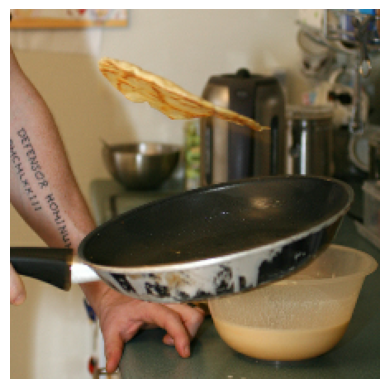

predicted: the girl is sitting in the in an orange slide
original: the person with the tattoos is holding dirty frying pan





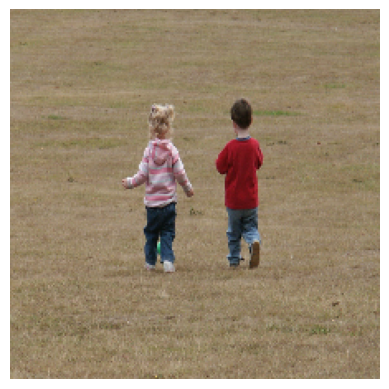

predicted: little boy wearing red shirt and the is running on the grass
original: two small children walking in field





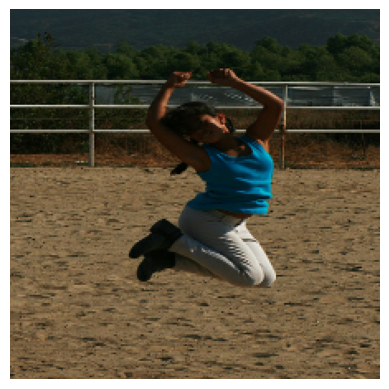

predicted: the little is wearing the blue and the beach
original: girl in white pants and blue tank top jumps





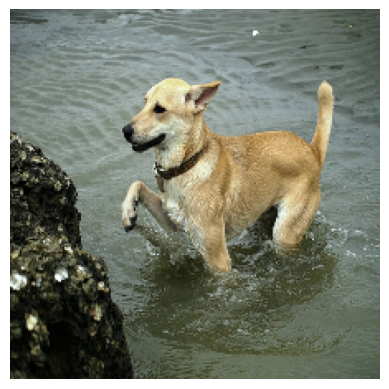

predicted: brown dog is swimming in the water water his mouth
original: dog has waded through shallow water to reach rock outcropping





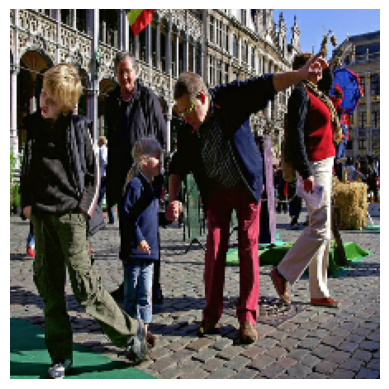

predicted: two men are standing to of to the camera while two men one
original: man holding little girl hand bends over and points something to her





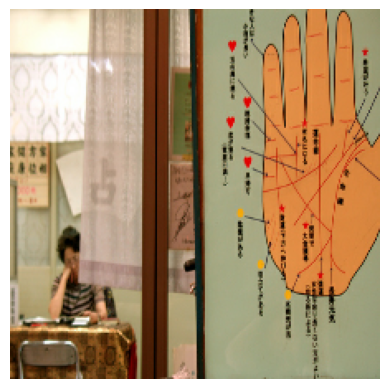

predicted: man in on an with with
original: woman is sitting at table waiting to tell customer 's fortune





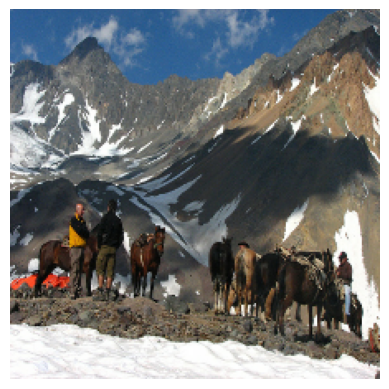

predicted: people in in the snow in front of mountain
original: two men and some horses on snowy mountain





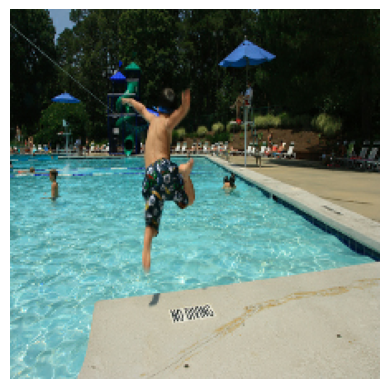

predicted: girl in in the air with
original: the boy is jumping into the swimming pool





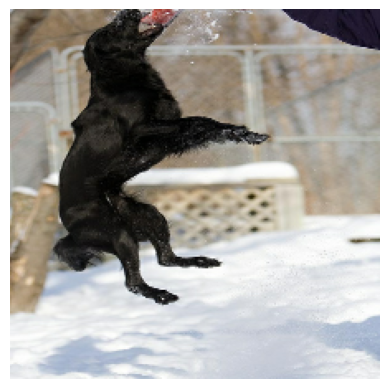

predicted: black dog is jumping into snow snow
original: the black dog jumps out of the snow to catch an object





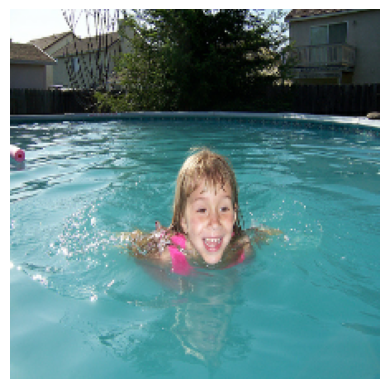

predicted: little girl swimming in swimming pool pool pool with her hands in her
original: smiling little girl swimming in outdoor pool





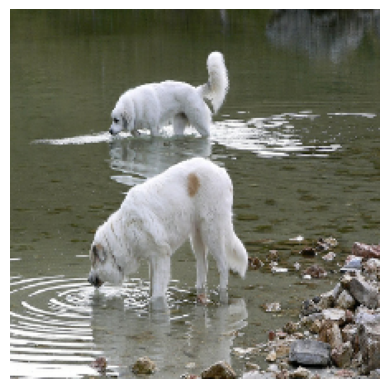

predicted: two white dogs are in in in water
original: two dogs drink water in lake





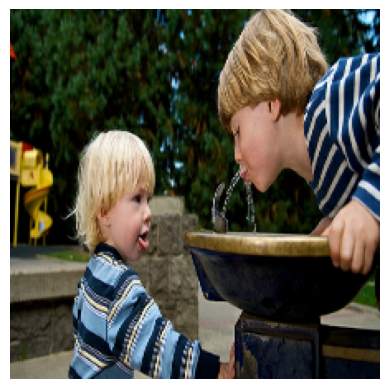

predicted: small child in blue shirt is is an orange shirt is eating in of yellow cotton candy with her hair
original: little boy drinks water from fountain while another little boy watches and makes face





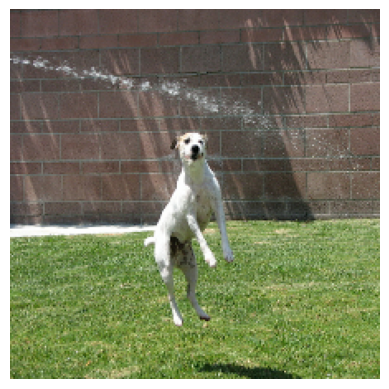

predicted: dog is running on the grass
original: white dog jumps from the grass into water from hose





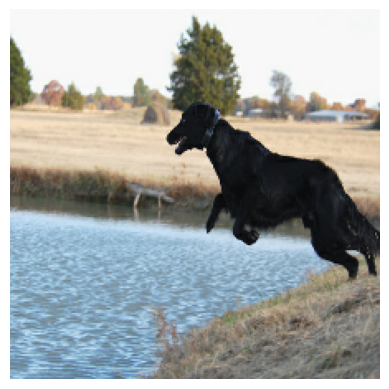

predicted: black dog jumps into the water
original: the dog is jumping into the lake





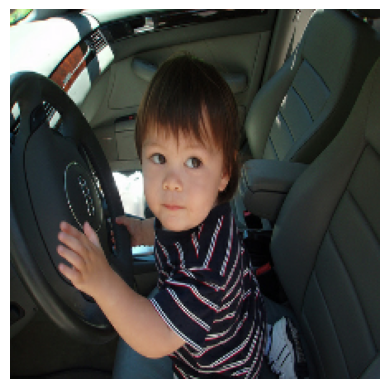

predicted: small boy with messy eyes sits on on bed
original: small baby sitting in car behind the steering wheel





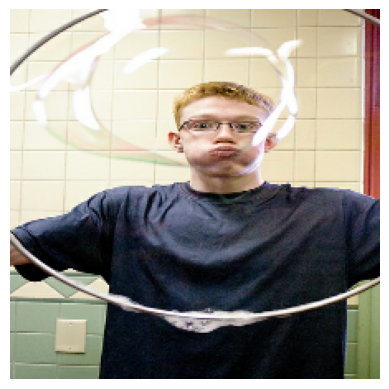

predicted: the boy wearing red shirt shirt red red shirt
original: young man in blue shirt peering through large bubble





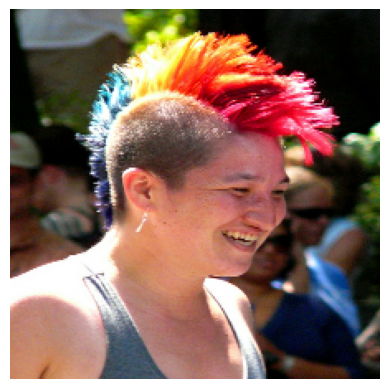

predicted: woman with pink hat and crowd crowd
original: smiling person with brightly colored mohawk hairstyle





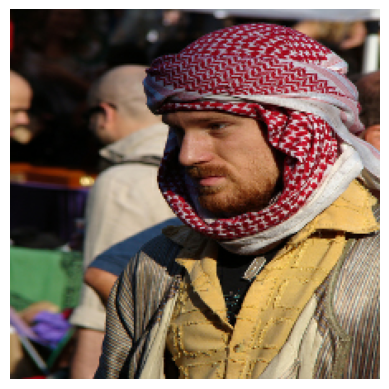

predicted: man in with his arm around his
original: man with facial hair wearing red and white palestinian style headscarf





In [20]:
for (image, label) in zip(i,l):
    show_and_tell(new_model,image,label)

In [21]:
new_model.evaluate(Test_data)

64/64 [==============================] - 51s 740ms/step - loss: 2.2370 - bleu_1: 0.2926 - bleu_2: 0.1709 - bleu_3: 0.1125 - bleu_4: 0.0839


[2.2370424270629883,
 0.29264596104621887,
 0.17094582319259644,
 0.11253397911787033,
 0.08388790488243103]

In [22]:
weights = model.get_weights()
inp_1 = Input(shape=(224,224,3))
inp_2 = Input(shape=(35,))
out_1 = CNN_feature_extractor(inp_1)
out_2 = Net_Vlad(out_1, 64)
out_f = LSTM_decoder(out_2, inp_2, teacher_forcing_ratio=0.5, test = False)
new_model = Model(inputs=[inp_1,inp_2],outputs=out_f)
new_model.set_weights(weights)
new_model.trainable = False
new_model.compile(optimizer='adam', loss = SparseCategoricalCrossentropy(from_logits=True), metrics = [bleu_1,bleu_2,bleu_3,bleu_4])

In [23]:
new_model.evaluate(Test_data)

64/64 [==============================] - 47s 681ms/step - loss: 1.3197 - bleu_1: 0.2825 - bleu_2: 0.1511 - bleu_3: 0.0854 - bleu_4: 0.0661


[1.3196824789047241,
 0.2824763059616089,
 0.1511354148387909,
 0.08544410765171051,
 0.06609813868999481]

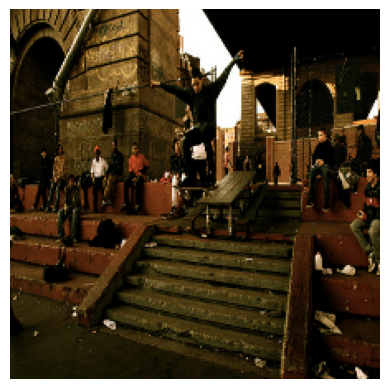

predicted: people and woman are at table table table table
original: man rides skateboard off of picnic table over the steps





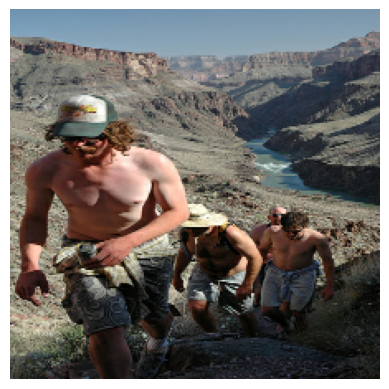

predicted: young woman in black hat hat and shirt
original: topless men walking up rocky path





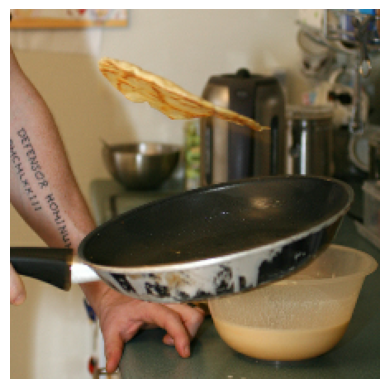

predicted: the girl is sitting red in in the seat
original: the person with the tattoos is holding dirty frying pan





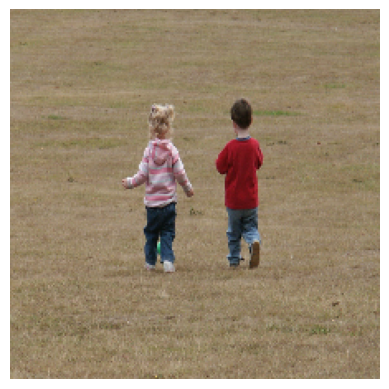

predicted: little boys are playing through the
original: two small children walking in field





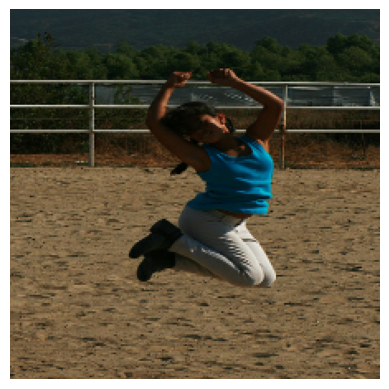

predicted: the in on the and on on the of the
original: girl in white pants and blue tank top jumps





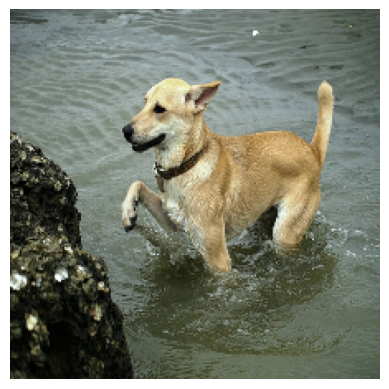

predicted: brown swimming in the water water with his in his
original: dog has waded through shallow water to reach rock outcropping





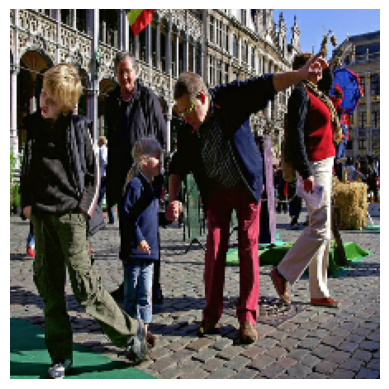

predicted: two and woman are to the to the yellow shirt
original: man holding little girl hand bends over and points something to her





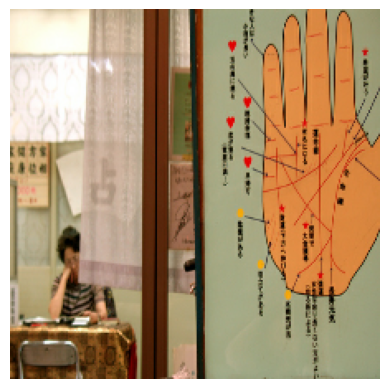

predicted: man in pink shirt is holding to to video video
original: woman is sitting at table waiting to tell customer 's fortune





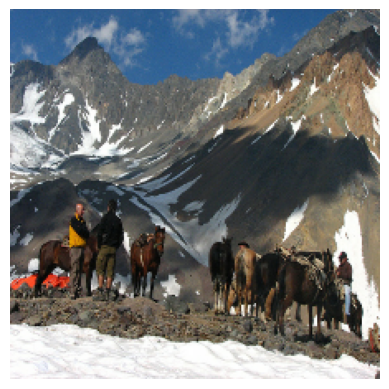

predicted: people men in the white in snow in
original: two men and some horses on snowy mountain





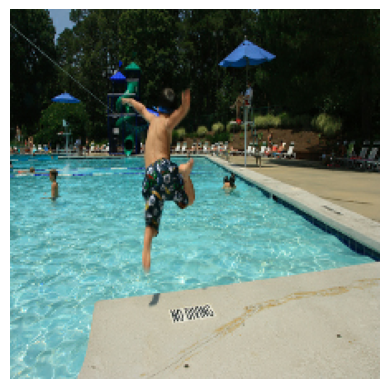

predicted: girl girl is jumping into the the the
original: the boy is jumping into the swimming pool





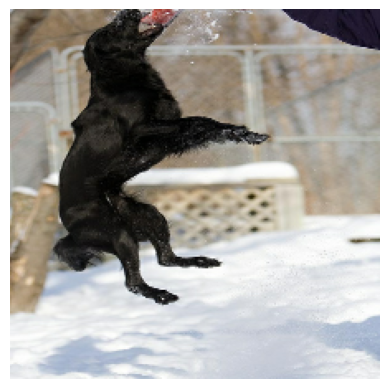

predicted: black black dog is in the snow snow red
original: the black dog jumps out of the snow to catch an object





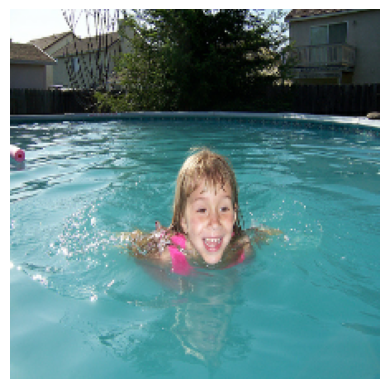

predicted: little boy swimming in in pool pool
original: smiling little girl swimming in outdoor pool





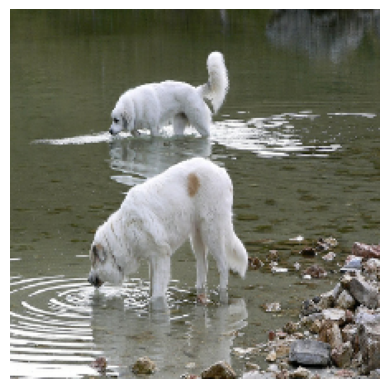

predicted: two white dogs are in in
original: two dogs drink water in lake





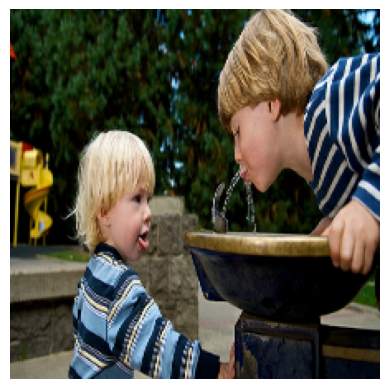

predicted: small boy in blue blue shirt is at child is in the face
original: little boy drinks water from fountain while another little boy watches and makes face





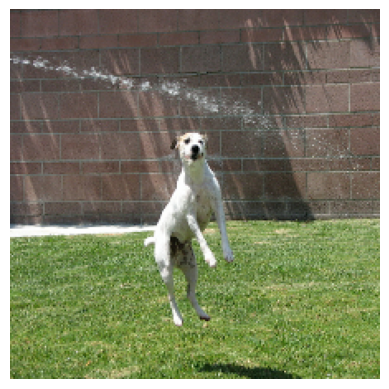

predicted: dog dog is running green green green in
original: white dog jumps from the grass into water from hose





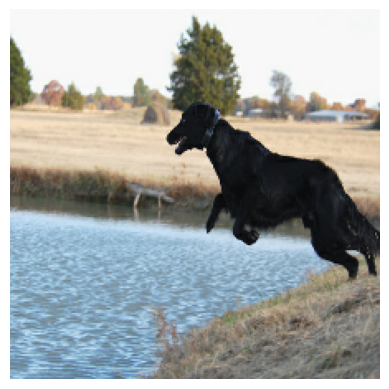

predicted: black black dog is into the water
original: the dog is jumping into the lake





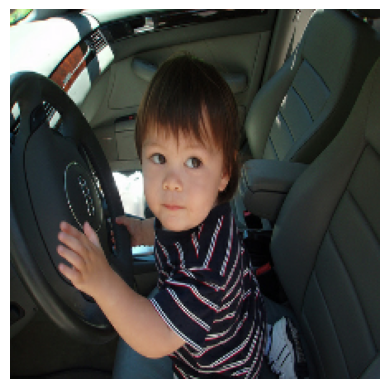

predicted: small boy with messy blue sitting on on boy
original: small baby sitting in car behind the steering wheel





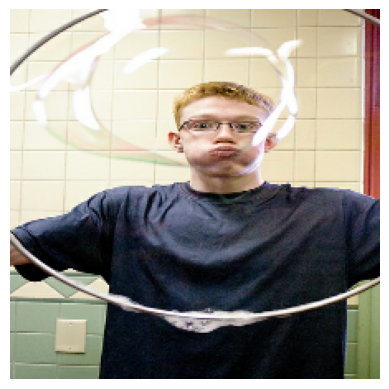

predicted: the boy wearing sunglasses cap and into red
original: young man in blue shirt peering through large bubble





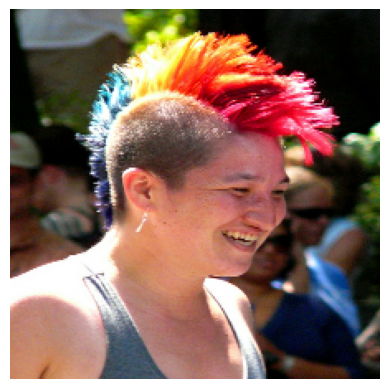

predicted: woman woman with pink colored hat
original: smiling person with brightly colored mohawk hairstyle





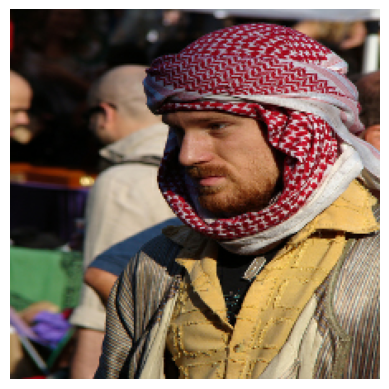

predicted: man in with his hair hair shirt hair and
original: man with facial hair wearing red and white palestinian style headscarf





In [24]:
for (image, label) in zip(i,l):
    show_and_tell(new_model,image,label)